In [ ]:
!pip install lightning --upgrade


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 821.1/821.1 kB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 80.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 33.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 35.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 43.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 963.5/963.5 kB 53.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
!pip install -q  pytorch-forecasting==1.4.0


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.9/260.9 kB 5.3 MB/s eta 0:00:00


In [ ]:
!pip install openpyxl

In [ ]:
# ================================================================
# 1. Imports & global settings
# ================================================================
import os, math, datetime, numpy as np, pandas as pd, matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
import holidays                    # pip install holidays

In [ ]:
# 2. Load the Excel data
# ================================================================
DATA_PATH = "/content/Hotel_Revenue_Data.xlsx"
raw = pd.read_excel(DATA_PATH)
raw["Date"] = pd.to_datetime(raw["Date"])


# Basic sanity check
assert raw[["Date", "MealPeriod", "RevenueCenterName", "CheckTotal"]].notna().all().all(), \
       "Found missing values – investigate!"




In [ ]:
# ================================================================
# 3. Aggregate to daily totals (per MealPeriod & RevenueCenter)
# ================================================================
daily = (raw
         .groupby(["Date", "MealPeriod", "RevenueCenterName"], as_index=False)
         .agg(Revenue=("CheckTotal", "sum")))

all_dates = pd.DataFrame({"Date": pd.date_range(daily.Date.min(),
                                                daily.Date.max(), freq="D")})
all_keys  = (daily[["MealPeriod", "RevenueCenterName"]]
             .drop_duplicates()
             .assign(dummy=1))

daily = (all_dates.assign(dummy=1)
         .merge(all_keys, on="dummy", how="left")
         .merge(daily, on=["Date", "MealPeriod", "RevenueCenterName"], how="left")
         .drop(columns="dummy")
         .fillna({"Revenue": 0.0}))

In [ ]:
# Assuming 'daily' DataFrame is already prepared and sorted properly
daily = daily.sort_values(["RevenueCenterName","MealPeriod","Date"]).reset_index(drop=True)

In [ ]:
revenue_center_4 = daily[daily["RevenueCenterName"] == "RevenueCenter_4"]
print(revenue_center_4.head())
# Summary statistics
summary = revenue_center_4["Revenue"].describe()
total_revenue = revenue_center_4["Revenue"].sum()
zero_count = (revenue_center_4["Revenue"] == 0).sum()
non_zero_count = (revenue_center_4["Revenue"] != 0).sum()

print("Summary Statistics:\n", summary)
print("Total Revenue:", total_revenue)
print("Zero Revenue Days:", zero_count)
print("Non-Zero Revenue Days:", non_zero_count)


           Date MealPeriod RevenueCenterName  Revenue
4374 2023-01-01  BreakFast   RevenueCenter_4      0.0
4375 2023-01-02  BreakFast   RevenueCenter_4      0.0
4376 2023-01-03  BreakFast   RevenueCenter_4      0.0
4377 2023-01-04  BreakFast   RevenueCenter_4      0.0
4378 2023-01-05  BreakFast   RevenueCenter_4      0.0
Summary Statistics:
 count    1458.000000
mean        0.000069
std         0.002619
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.100000
Name: Revenue, dtype: float64
Total Revenue: 0.1
Zero Revenue Days: 1457
Non-Zero Revenue Days: 1


In [ ]:


daily = daily[daily["RevenueCenterName"] != "RevenueCenter_4"].reset_index(drop=True)


In [ ]:
# Check how many unique revenue centers and meal periods
print("Revenue Centers:", daily["RevenueCenterName"].nunique())
print("Meal Periods:", daily["MealPeriod"].unique())
print("Date Range:", daily["Date"].min(), "to", daily["Date"].max())

# Rows per revenue center
print(daily["RevenueCenterName"].value_counts())


Revenue Centers: 8
Meal Periods: ['BreakFast' 'Dinner' 'Lunch']
Date Range: 2023-01-01 00:00:00 to 2024-04-30 00:00:00
RevenueCenterName
RevenueCenter_1    1458
RevenueCenter_2    1458
RevenueCenter_3    1458
RevenueCenter_5    1458
RevenueCenter_6    1458
RevenueCenter_7    1458
RevenueCenter_8    1458
RevenueCenter_9    1458
Name: count, dtype: int64


In [ ]:
# Group by RevenueCenter and MealPeriod for total revenue and days
summary = (
    daily.groupby(["RevenueCenterName", "MealPeriod"])
    .agg(
        TotalRevenue=("Revenue", "sum"),
        MeanRevenue=("Revenue", "mean"),
        MedianRevenue=("Revenue", "median"),
        StdDevRevenue=("Revenue", "std"),
        NonZeroDays=("Revenue", lambda x: (x > 0).sum()),
        TotalDays=("Revenue", "count")
    )
)
summary["ActiveRate (%)"] = (summary["NonZeroDays"] / summary["TotalDays"] * 100).round(2)

display(summary.sort_values("RevenueCenterName", ascending=True))


TotalRevenue   MeanRevenue  MedianRevenue  \
RevenueCenterName MealPeriod                                              
RevenueCenter_1   BreakFast      466923.36    960.747654         718.00   
                  Dinner        1316577.12   2709.006420        2319.00   
                  Lunch          364174.05    749.329321         598.50   
RevenueCenter_2   BreakFast      176735.75    363.653807         269.00   
                  Dinner         261483.49    538.031872         393.25   
                  Lunch          223611.70    460.106379         363.00   
RevenueCenter_3   BreakFast      160280.15    329.794547         241.00   
                  Dinner        5557294.26  11434.761852       10225.10   
                  Lunch          855740.23   1760.782366        1518.25   
RevenueCenter_5   Dinner        3412907.88   7022.444198        3411.75   
                  Lunch          932141.06   1917.985720        1022.50   
                  BreakFast     8366458.20  17214.934568       15636.50   
RevenueCenter_6   BreakFast       74111.65    152.493107          41.75   
                  Dinner         422632.80    869.614815         433.75   
                  Lunch          197534.40    406.449383         275.00   
RevenueCenter_7   BreakFast       18380.00     37.818930          12.00   
                  Dinner          32277.00     66.413580          42.00   
                  Lunch           14249.00     29.318930           6.00   
RevenueCenter_8   BreakFast      287675.00    591.923868           0.00   
                  Dinner        6598394.00  13576.942387        6750.00   
                  Lunch         2870501.50   5906.381687           0.00   
RevenueCenter_9   Dinner          24560.00     50.534979           0.00   
                  BreakFast       82220.00    169.176955          70.00   
                  Lunch           85180.00    175.267490         110.00   

                              StdDevRevenue  NonZeroDays  TotalDays  \
RevenueCenterName MealPeriod                                          
RevenueCenter_1   BreakFast      908.893384          483        486   
                  Dinner        1527.833988          486        486   
                  Lunch          649.899517          479        486   
RevenueCenter_2   BreakFast      365.473548          442        486   
                  Dinner         687.495202          459        486   
                  Lunch          494.995765          456        486   
RevenueCenter_3   BreakFast      338.194771          389        486   
                  Dinner        6301.617135          486        486   
                  Lunch         1126.703866          486        486   
RevenueCenter_5   Dinner        7944.288912          486        486   
                  Lunch         2824.427694          472        486   
                  BreakFast     5595.778822          486        486   
RevenueCenter_6   BreakFast      274.888690          268        486   
                  Dinner        3473.788337          460        486   
                  Lunch          486.735591          419        486   
RevenueCenter_7   BreakFast       69.851832          273        486   
                  Dinner          83.125664          374        486   
                  Lunch           51.421235          255        486   
RevenueCenter_8   BreakFast     2673.575843           39        486   
                  Dinner       19018.592786          283        486   
                  Lunch        12408.830353          210        486   
RevenueCenter_9   Dinner         121.580747          152        486   
                  BreakFast      252.765358          326        486   
                  Lunch          204.992659          344        486   

                              ActiveRate (%)  
RevenueCenterName MealPeriod                  
RevenueCenter_1   BreakFast            99.38  
                  Dinner              100.00  
                  Lunch                98.56

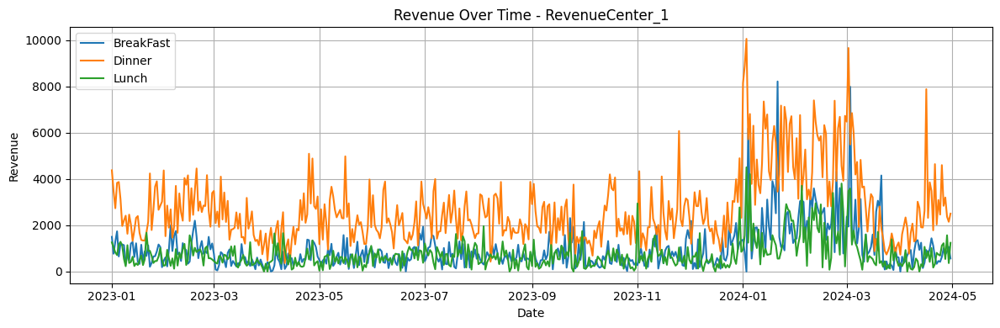

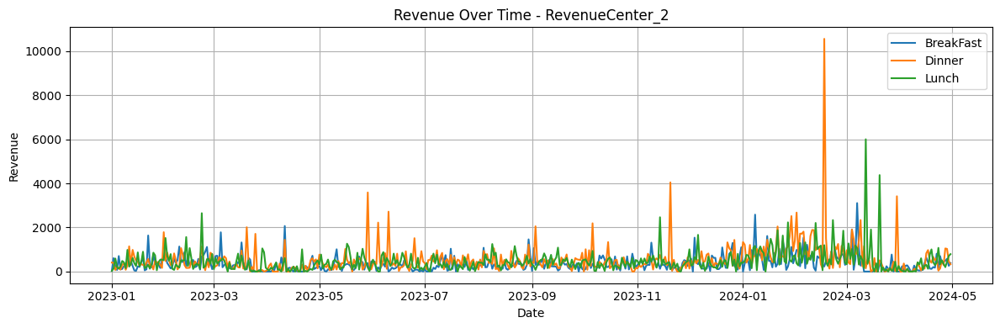

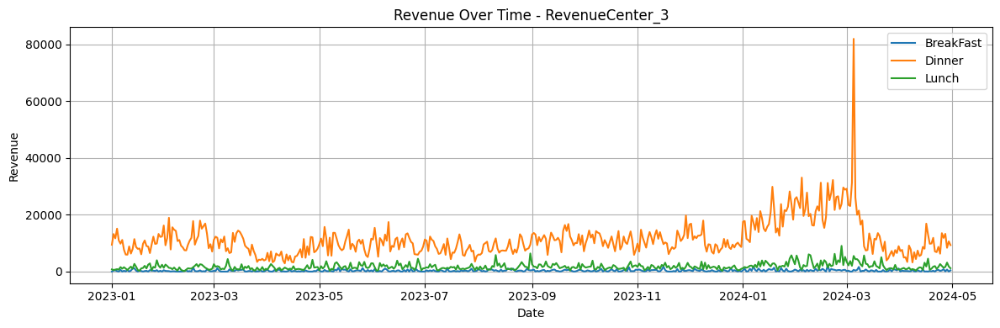

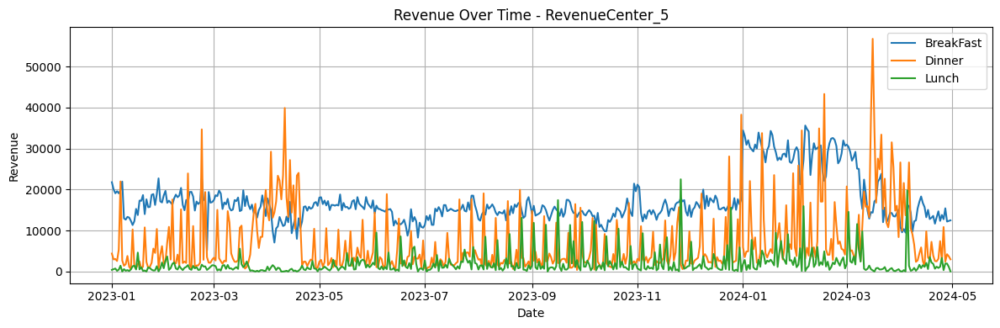

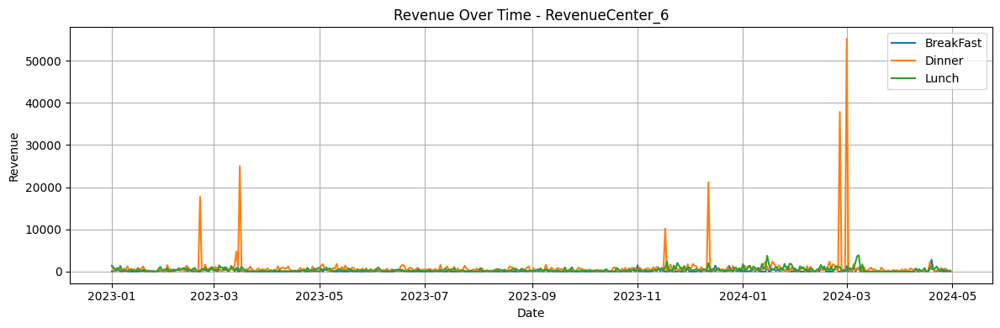

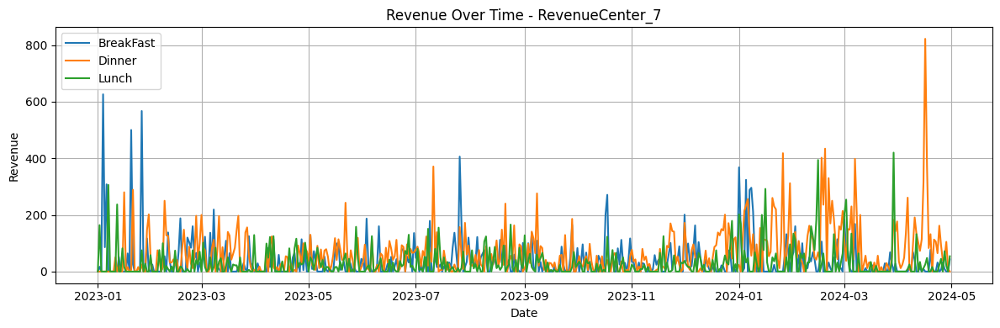

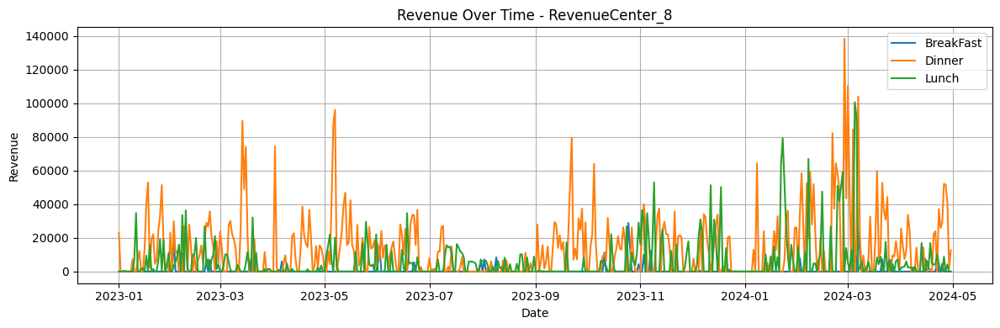

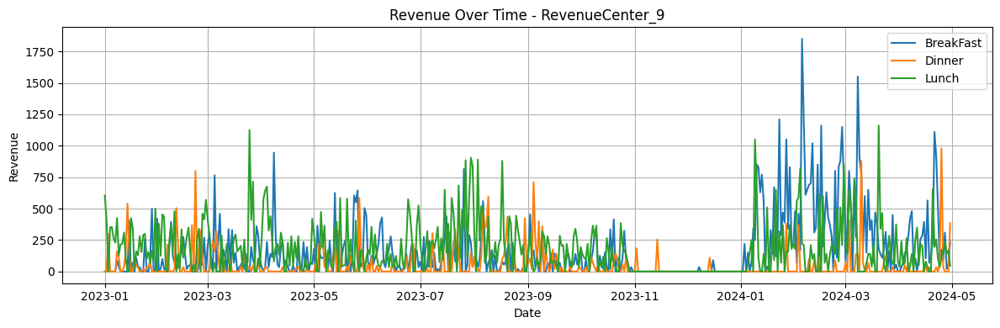

In [ ]:
import matplotlib.pyplot as plt

# Unique revenue centers
revenue_centers = daily["RevenueCenterName"].unique()

for rc in revenue_centers:
    plt.figure(figsize=(12, 4))
    rc_data = daily[daily["RevenueCenterName"] == rc]

    for meal in rc_data["MealPeriod"].unique():
        subset = rc_data[rc_data["MealPeriod"] == meal]
        plt.plot(subset["Date"], subset["Revenue"], label=meal)

    plt.title(f"Revenue Over Time - {rc}")
    plt.xlabel("Date")
    plt.ylabel("Revenue")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
# Add day-of-week and weekend flag
daily["Weekday"] = daily["Date"].dt.day_name()
daily["IsWeekend"] = daily["Date"].dt.weekday >= 5  # Saturday=5, Sunday=6


In [ ]:
weekday_summary = (
    daily.groupby(["RevenueCenterName", "MealPeriod", "IsWeekend"])
    .agg(
        AvgRevenue=("Revenue", "mean"),
        MedianRevenue=("Revenue", "median"),
        TotalRevenue=("Revenue", "sum"),
        Count=("Revenue", "count")
    )
    .reset_index()
)

# Rename True/False for clarity
weekday_summary["DayType"] = weekday_summary["IsWeekend"].map({True: "Weekend", False: "Weekday"})
weekday_summary.drop(columns="IsWeekend", inplace=True)

display(weekday_summary.sort_values("RevenueCenterName", ascending=True))


,RevenueCenterName,MealPeriod,AvgRevenue,MedianRevenue,TotalRevenue,Count,DayType
0,RevenueCenter_1,BreakFast,904.135447,680.00,313735.00,347,Weekday
1,RevenueCenter_1,BreakFast,1102.074532,798.00,153188.36,139,Weekend
2,RevenueCenter_1,Dinner,2739.955908,2451.00,950764.70,347,Weekday
3,RevenueCenter_1,Dinner,2631.744029,2144.00,365812.42,139,Weekend
4,RevenueCenter_1,Lunch,740.314986,613.00,256889.30,347,Weekday
5,RevenueCenter_1,Lunch,771.832734,569.50,107284.75,139,Weekend
11,RevenueCenter_2,Lunch,367.933453,309.50,51142.75,139,Weekend
10,RevenueCenter_2,Lunch,497.028674,380.00,172468.95,347,Weekday
9,RevenueCenter_2,Dinner,630.550360,365.00,87646.50,139,Weekend
7,RevenueCenter_2,BreakFast,293.219424,206.00,40757.50,139,Weekend


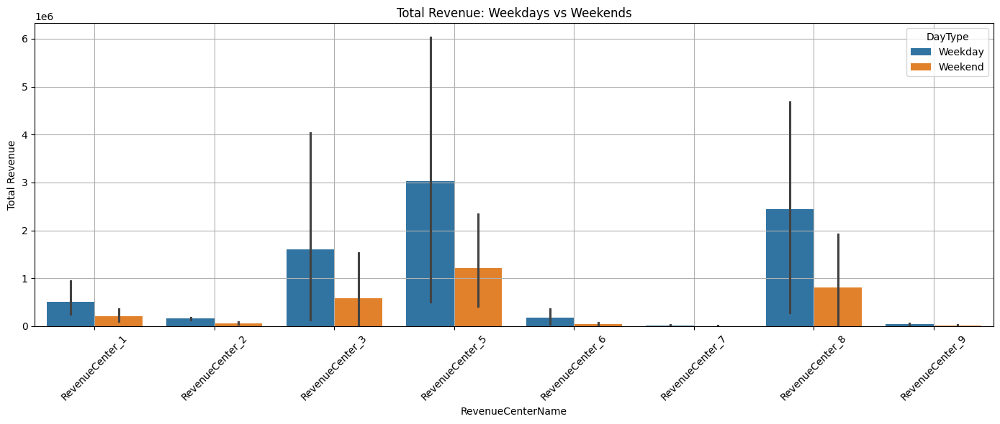

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
sns.barplot(
    data=weekday_summary,
    x="RevenueCenterName",
    y="TotalRevenue",
    hue="DayType"
)
plt.title("Total Revenue: Weekdays vs Weekends")
plt.ylabel("Total Revenue")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


Text(0.5, 0.98, 'Total Revenue by Revenue Center: Weekdays vs Weekends')

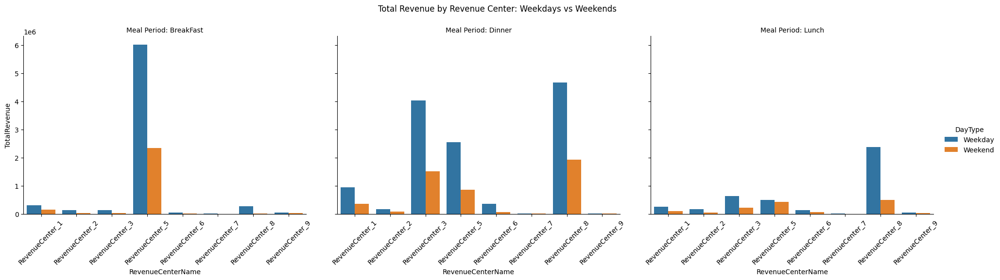

In [ ]:
g = sns.catplot(
    data=weekday_summary,
    x="RevenueCenterName", y="TotalRevenue",
    hue="DayType", col="MealPeriod",
    kind="bar", height=5, aspect=1.3
)
g.set_titles("Meal Period: {col_name}")
g.set_xticklabels(rotation=45)
g.fig.subplots_adjust(top=0.85)
g.fig.suptitle("Total Revenue by Revenue Center: Weekdays vs Weekends")


In [ ]:
# Group by RevenueCenterName and compute key statistics
summary_all_centers = (
    daily.groupby("RevenueCenterName")
    .agg(
        TotalRevenue=("Revenue", "sum"),
        NonZeroDays=("Revenue", lambda x: (x != 0).sum()),
        TotalDays=("Revenue", "count")
    )
)

# Calculate percentage of active (non-zero) days
summary_all_centers["ActiveDayPercentage"] = (
    summary_all_centers["NonZeroDays"] / summary_all_centers["TotalDays"] * 100
).round(2)

# Sort by TotalRevenue for easier interpretation
summary_all_centers = summary_all_centers.sort_values(by="TotalRevenue", ascending=False)

print(summary_all_centers)


                   TotalRevenue  NonZeroDays  TotalDays  ActiveDayPercentage
RevenueCenterName                                                           
RevenueCenter_5     12711507.14         1444       1458                99.04
RevenueCenter_8      9756570.50          532       1458                36.49
RevenueCenter_3      6573314.64         1361       1458                93.35
RevenueCenter_1      2147674.53         1448       1458                99.31
RevenueCenter_6       694278.85         1147       1458                78.67
RevenueCenter_2       661830.94         1357       1458                93.07
RevenueCenter_9       191960.00          822       1458                56.38
RevenueCenter_7        64906.00          902       1458                61.87


⏹️  Outliers BEFORE clamping


/tmp/ipython-input-10-1791287602.py:17: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(_count)
/tmp/ipython-input-10-1791287602.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(_clamp)
/tmp/ipython-input-10-1791287602.py:17: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be

,RevenueCenterName,MealPeriod,OutlierCount
0,RevenueCenter_1,BreakFast,33
1,RevenueCenter_1,Dinner,31
2,RevenueCenter_1,Lunch,26
3,RevenueCenter_2,BreakFast,24
4,RevenueCenter_2,Dinner,33
5,RevenueCenter_2,Lunch,26
6,RevenueCenter_3,BreakFast,11
7,RevenueCenter_3,Dinner,37
8,RevenueCenter_3,Lunch,22
9,RevenueCenter_5,BreakFast,68



✅ Outliers AFTER clamping


,RevenueCenterName,MealPeriod,OutlierCount
0,RevenueCenter_1,BreakFast,0
1,RevenueCenter_1,Dinner,0
2,RevenueCenter_1,Lunch,0
3,RevenueCenter_2,BreakFast,0
4,RevenueCenter_2,Dinner,0
5,RevenueCenter_2,Lunch,0
6,RevenueCenter_3,BreakFast,0
7,RevenueCenter_3,Dinner,0
8,RevenueCenter_3,Lunch,0
9,RevenueCenter_5,BreakFast,0


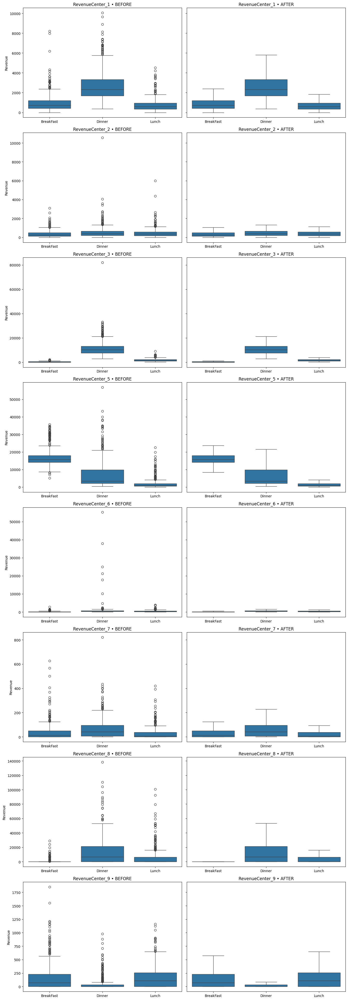

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------------------------------------------------------
# 1) Helper: count IQR outliers in any grouped DataFrame
# ------------------------------------------------------------------
def count_outliers(df, group_cols, value_col, factor=1.5):
    def _count(group):
        q1, q3 = group[value_col].quantile([0.25, 0.75])
        iqr = q3 - q1
        lo, hi = q1 - factor*iqr, q3 + factor*iqr
        return ((group[value_col] < lo) | (group[value_col] > hi)).sum()
    return (
        df.groupby(group_cols)
          .apply(_count)
          .reset_index(name="OutlierCount")
    )

# ------------------------------------------------------------------
# 2) Helper: clamp outliers **in place** to upper / lower bounds
# ------------------------------------------------------------------
def clamp_outliers(df, group_cols, value_col, factor=1.5):
    def _clamp(group):
        q1, q3 = group[value_col].quantile([0.25, 0.75])
        iqr = q3 - q1
        lo, hi = q1 - factor*iqr, q3 + factor*iqr
        group[value_col] = group[value_col].clip(lo, hi)
        return group
    return (
        df.groupby(group_cols, group_keys=False)
          .apply(_clamp)
          .reset_index(drop=True)
    )

# ------------------------------------------------------------------
# 3) Apply to ALL revenue centers & meal periods
# ------------------------------------------------------------------
group_cols = ["RevenueCenterName", "MealPeriod"]
value_col  = "Revenue"

before_counts = count_outliers(daily, group_cols, value_col)
daily_clamped = clamp_outliers(daily.copy(), group_cols, value_col)
after_counts  = count_outliers(daily_clamped, group_cols, value_col)

print("⏹️  Outliers BEFORE clamping")
display(before_counts)
print("\n✅ Outliers AFTER clamping")
display(after_counts)

# ------------------------------------------------------------------
# 4) Quick visual check – box‑plots for EVERY revenue center
# ------------------------------------------------------------------
centers = daily["RevenueCenterName"].unique()
n_centers = len(centers)

fig, axes = plt.subplots(
    n_centers, 2, figsize=(14, 5 * n_centers), sharey="row"
)

for i, center in enumerate(sorted(centers)):
    # --- before ---
    sns.boxplot(
        data=daily[daily["RevenueCenterName"] == center],
        x="MealPeriod", y=value_col, ax=axes[i, 0]
    )
    axes[i, 0].set_title(f"{center} • BEFORE")
    axes[i, 0].set_xlabel("")
    # --- after ---
    sns.boxplot(
        data=daily_clamped[daily_clamped["RevenueCenterName"] == center],
        x="MealPeriod", y=value_col, ax=axes[i, 1]
    )
    axes[i, 1].set_title(f"{center} • AFTER")
    axes[i, 1].set_xlabel("")

for col in (0, 1):
    axes[0, col].set_ylabel("Revenue")

plt.tight_layout()
plt.show()


In [ ]:
daily_clamped

,Date,MealPeriod,RevenueCenterName,Revenue,Weekday,IsWeekend
0,2023-01-01,BreakFast,RevenueCenter_1,1499.4,Sunday,True
1,2023-01-02,BreakFast,RevenueCenter_1,771.0,Monday,False
2,2023-01-03,BreakFast,RevenueCenter_1,1302.4,Tuesday,False
3,2023-01-04,BreakFast,RevenueCenter_1,1737.0,Wednesday,False
4,2023-01-05,BreakFast,RevenueCenter_1,653.0,Thursday,False
...,...,...,...,...,...,...
11659,2024-04-26,Lunch,RevenueCenter_9,160.0,Friday,False
11660,2024-04-27,Lunch,RevenueCenter_9,235.0,Saturday,True
11661,2024-04-28,Lunch,RevenueCenter_9,140.0,Sunday,True
11662,2024-04-29,Lunch,RevenueCenter_9,170.0,Monday,False


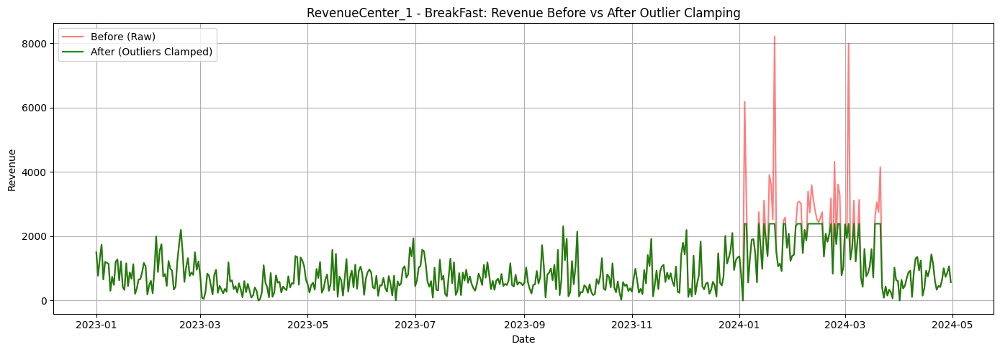

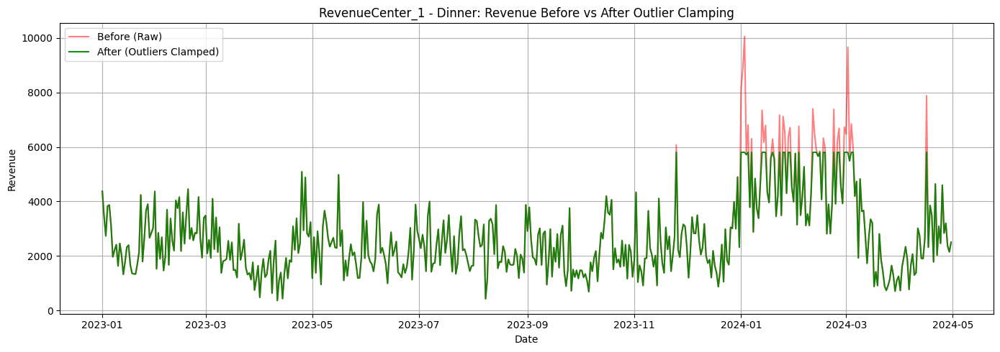

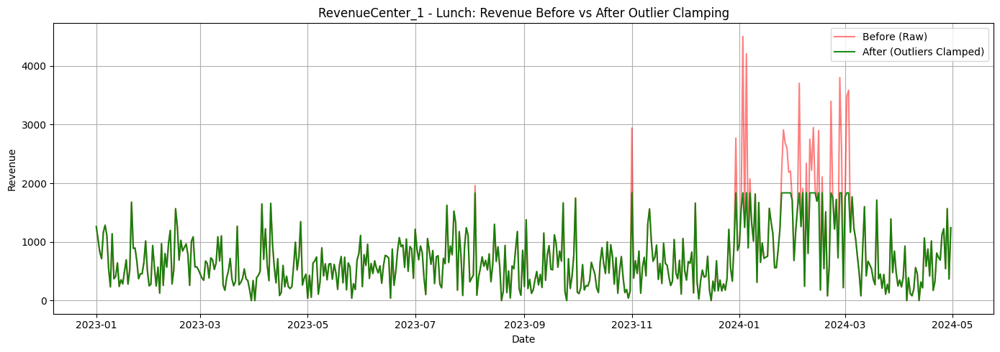

In [ ]:
import matplotlib.pyplot as plt

# Select a specific revenue center for comparison
center_name = "RevenueCenter_1"  # Change this to any actual center name if needed

# Filter original and cleaned data for that center
original_center = daily[daily["RevenueCenterName"] == center_name]
cleaned_center = daily_clamped[daily_clamped["RevenueCenterName"] == center_name]

# Get all meal periods available for this center
meal_periods = original_center["MealPeriod"].unique()

# Plot Before vs After for each MealPeriod
for meal in meal_periods:
    orig = original_center[original_center["MealPeriod"] == meal]
    clean = cleaned_center[cleaned_center["MealPeriod"] == meal]

    plt.figure(figsize=(14, 5))
    plt.plot(orig["Date"], orig["Revenue"], label="Before (Raw)", alpha=0.5, color="red")
    plt.plot(clean["Date"], clean["Revenue"], label="After (Outliers Clamped)", alpha=0.9, color="green")
    plt.title(f"{center_name} - {meal}: Revenue Before vs After Outlier Clamping")
    plt.xlabel("Date")
    plt.ylabel("Revenue")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


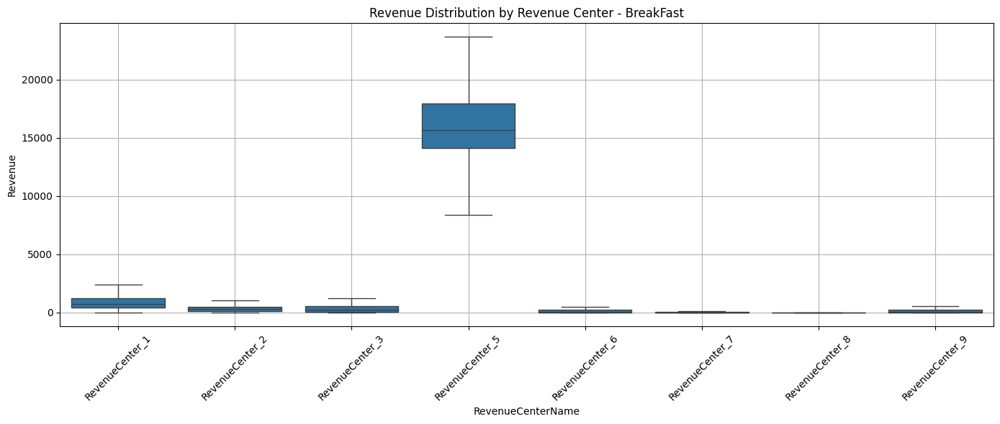

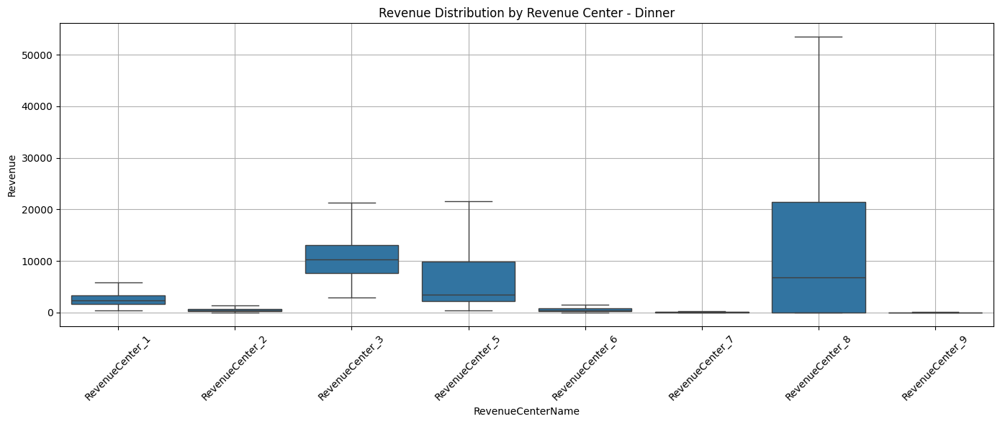

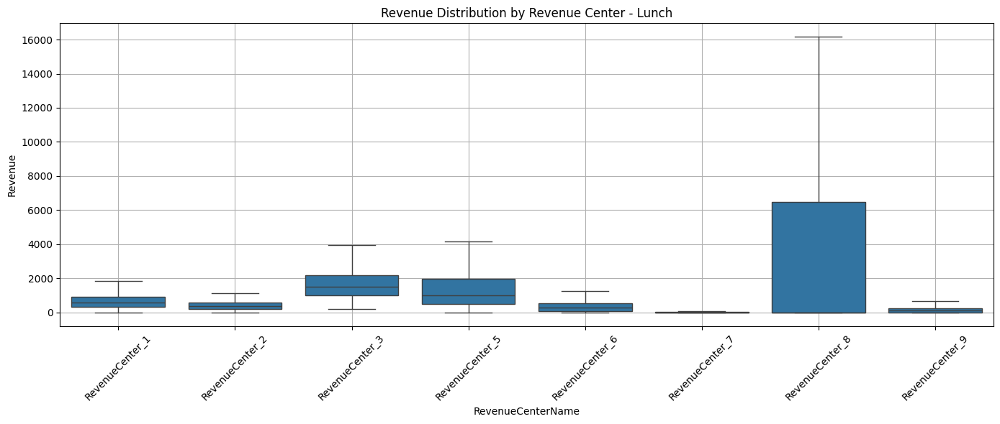

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Unique meal periods
meal_periods = daily_clamped["MealPeriod"].unique()

for meal in meal_periods:
    plt.figure(figsize=(14, 6))
    subset = daily_clamped[daily_clamped["MealPeriod"] == meal]

    sns.boxplot(x="RevenueCenterName", y="Revenue", data=subset)

    plt.title(f"Revenue Distribution by Revenue Center - {meal}")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:


# ================================================================
# 4. Feature Engineering
# ================================================================
def add_calendar_features(df):
    df["dow"]   = df["Date"].dt.weekday
    df["month"] = df["Date"].dt.month
    df["dow_sin"]   = np.sin(2*np.pi*df.dow / 7)
    df["dow_cos"]   = np.cos(2*np.pi*df.dow / 7)
    df["month_sin"] = np.sin(2*np.pi*df.month / 12)
    df["month_cos"] = np.cos(2*np.pi*df.month / 12)
    uae_holidays = holidays.UnitedArabEmirates()
    df["is_holiday"] = df["Date"].isin(uae_holidays).astype(int)
    df["is_weekend"] = (df.dow >= 5).astype(int)
    return df

df = add_calendar_features(daily_clamped)

# ================================================================
# 5. Normalize revenue + encode IDs
# ================================================================
mp_lookup = {mp: i for i, mp in enumerate(df["MealPeriod"].unique())}
rc_lookup = {rc: i for i, rc in enumerate(df["RevenueCenterName"].unique())}
df["mp_id"] = df["MealPeriod"].map(mp_lookup)
df["rc_id"] = df["RevenueCenterName"].map(rc_lookup)

# 6. Lag & Rolling Features (per RevenueCenter + MealPeriod)
# ================================================================
df = df.sort_values(["RevenueCenterName", "MealPeriod", "Date"]).reset_index(drop=True)

# 1-day lag feature
df["Revenue_Lag1"] = (df.groupby(["RevenueCenterName", "MealPeriod"])["Revenue"]
                         .shift(1))

# 7-day rolling average (excluding current day)
df["Revenue_Roll7"] = (df.groupby(["RevenueCenterName", "MealPeriod"])["Revenue"]
                          .transform(lambda x: x.shift(1).rolling(window=7, min_periods=1).mean()))

# Final check
# ================================================================
print(df.tail(10))


            Date MealPeriod RevenueCenterName  Revenue    Weekday  IsWeekend  \
11654 2024-04-21      Lunch   RevenueCenter_9    195.0     Sunday       True   
11655 2024-04-22      Lunch   RevenueCenter_9    255.0     Monday      False   
11656 2024-04-23      Lunch   RevenueCenter_9    105.0    Tuesday      False   
11657 2024-04-24      Lunch   RevenueCenter_9     35.0  Wednesday      False   
11658 2024-04-25      Lunch   RevenueCenter_9    105.0   Thursday      False   
11659 2024-04-26      Lunch   RevenueCenter_9    160.0     Friday      False   
11660 2024-04-27      Lunch   RevenueCenter_9    235.0   Saturday       True   
11661 2024-04-28      Lunch   RevenueCenter_9    140.0     Sunday       True   
11662 2024-04-29      Lunch   RevenueCenter_9    170.0     Monday      False   
11663 2024-04-30      Lunch   RevenueCenter_9     45.0    Tuesday      False   

       dow  month   dow_sin   dow_cos  month_sin  month_cos  is_holiday  \
11654    6      4 -0.781831  0.623490   0.86

In [ ]:
from pytorch_forecasting.models.temporal_fusion_transformer import TemporalFusionTransformer
import lightning.pytorch as pl
from pytorch_forecasting import TemporalFusionTransformer, TimeSeriesDataSet, Baseline
from pytorch_forecasting.metrics import QuantileLoss
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import EarlyStopping
import torch
import numpy as np
import pandas as pd
import holidays
from sklearn.preprocessing import StandardScaler

In [ ]:
import warnings
warnings.filterwarnings("ignore", message="X does not have valid feature names")


In [ ]:
# plt.figure(figsize=(12, 5))

# # Plot raw data points with lines
# sns.lineplot(data=rc_df, x='Date', y='Revenue', hue='MealPeriod', marker='o', alpha=0.5)

# # Add rolling mean (window=7 days) as trend lines
# for meal_period, grp in rc_df.groupby('MealPeriod'):
#     grp = grp.sort_values('Date')
#     rolling_mean = grp.set_index('Date')['Revenue'].rolling(window=7, min_periods=1).mean()
#     plt.plot(rolling_mean.index, rolling_mean.values, label=f'{meal_period} Trend', linewidth=2)

# plt.title(f"Daily Revenue and 7-day Rolling Trend by MealPeriod - {revenue_center}")
# plt.xlabel("Date")
# plt.ylabel("Revenue")
# plt.legend()
# plt.show()


In [ ]:
# import matplotlib.pyplot as plt
# import seaborn as sns

# all_centers = df["RevenueCenterName"].unique()

# for revenue_center in all_centers:
#     rc_df = df[df["RevenueCenterName"] == revenue_center].copy()
#     rc_df['Date'] = pd.to_datetime(rc_df['Date'])

#     plt.figure(figsize=(12, 5))

#     # Plot raw data points with lines
#     sns.lineplot(data=rc_df, x='Date', y='Revenue', hue='MealPeriod', marker='o', alpha=0.5)

#     # Add rolling mean (window=7 days) as trend lines per MealPeriod
#     for meal_period, grp in rc_df.groupby('MealPeriod'):
#         grp = grp.sort_values('Date')
#         rolling_mean = grp.set_index('Date')['Revenue'].rolling(window=7, min_periods=1).mean()
#         plt.plot(rolling_mean.index, rolling_mean.values, label=f'{meal_period} Trend', linewidth=2)

#     plt.title(f"Daily Revenue and 7-day Rolling Trend by MealPeriod - {revenue_center}")
#     plt.xlabel("Date")
#     plt.ylabel("Revenue")
#     plt.legend()
#     plt.show()


In [ ]:
# import matplotlib.pyplot as plt
# import seaborn as sns

# # Function to perform basic EDA for a given revenue center
# def eda_for_revenue_center(df, revenue_center):
#     # Filter data for this revenue center
#     rc_df = df[df["RevenueCenterName"] == revenue_center]

#     print(f"--- EDA Summary for {revenue_center} ---")
#     print(f"Total records: {len(rc_df)}")
#     print(f"Date range: {rc_df['Date'].min()} to {rc_df['Date'].max()}")
#     print("\nRevenue statistics:")
#     print(rc_df["Revenue"].describe())

#     # Plot revenue over time by MealPeriod
#     plt.figure(figsize=(12, 4))
#     sns.lineplot(data=rc_df, x="Date", y="Revenue", hue="MealPeriod", marker="o")
#     plt.title(f"Daily Revenue Over Time by MealPeriod - {revenue_center}")
#     plt.xlabel("Date")
#     plt.ylabel("Revenue")
#     plt.legend(title="MealPeriod")
#     plt.show()


#     # Revenue distribution by MealPeriod
#     plt.figure(figsize=(8,4))
#     sns.boxplot(data=rc_df, x="MealPeriod", y="Revenue")
#     plt.title(f"Revenue Distribution by MealPeriod - {revenue_center}")
#     plt.show()

#     # Optional: Heatmap of average revenue by day-of-week and meal period
#     heatmap_data = rc_df.pivot_table(index="dow", columns="MealPeriod", values="Revenue", aggfunc="mean")
#     plt.figure(figsize=(8, 5))
#     sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="coolwarm")
#     plt.title(f"Avg Revenue by Day of Week & MealPeriod - {revenue_center}")
#     plt.xlabel("MealPeriod")
#     plt.ylabel("Day of Week (0=Mon,6=Sun)")
#     plt.show()


# # Example: Run for RevenueCenter_1
# eda_for_revenue_center(df, "RevenueCenter_1")


In [ ]:
# import matplotlib.pyplot as plt
# import seaborn as sns

# def plot_revenue_over_time_by_mealperiod(df, revenue_center):
#     rc_df = df[df["RevenueCenterName"] == revenue_center]

#     plt.figure(figsize=(12, 4))
#     sns.lineplot(data=rc_df, x="Date", y="Revenue", hue="MealPeriod", marker="o")
#     plt.title(f"Daily Revenue Over Time by MealPeriod - {revenue_center}")
#     plt.xlabel("Date")
#     plt.ylabel("Revenue")
#     plt.legend(title="MealPeriod")
#     plt.show()

# def plot_revenue_distribution_by_mealperiod(df, revenue_center):
#     rc_df = df[df["RevenueCenterName"] == revenue_center]

#     plt.figure(figsize=(8, 4))
#     sns.boxplot(data=rc_df, x="MealPeriod", y="Revenue")
#     plt.title(f"Revenue Distribution by MealPeriod - {revenue_center}")
#     plt.show()

# def plot_heatmap_avg_revenue_dow_mealperiod(df, revenue_center):
#     rc_df = df[df["RevenueCenterName"] == revenue_center]

#     # Pivot table: average revenue by day-of-week and meal period
#     heatmap_data = rc_df.pivot_table(index="dow", columns="MealPeriod", values="Revenue", aggfunc="mean")

#     plt.figure(figsize=(8, 5))
#     sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="coolwarm")
#     plt.title(f"Avg Revenue by Day of Week & MealPeriod - {revenue_center}")
#     plt.xlabel("MealPeriod")
#     plt.ylabel("Day of Week (0=Mon,6=Sun)")
#     plt.show()



In [ ]:
# all_centers = df["RevenueCenterName"].unique()

# for center in all_centers:
#     print(f"Plots for {center}:")
#     plot_revenue_over_time_by_mealperiod(df, center)
#     plot_revenue_distribution_by_mealperiod(df, center)
#     plot_heatmap_avg_revenue_dow_mealperiod(df, center)


In [ ]:
# Fill NaNs in lag and rolling features after creation
df["Revenue_Lag1"] = df["Revenue_Lag1"].fillna(0)  # or .fillna(0)
df["Revenue_Roll7"] = df["Revenue_Roll7"].fillna(0)  # or .fillna(df["Revenue"])



In [ ]:


# ----------------------------------------
# 6. Create time index & train/val split
# ----------------------------------------
# ----------------------------------------
# Assuming 'daily' DataFrame is already prepared and sorted properly
df = df.sort_values(["mp_id", "rc_id", "Date"]).reset_index(drop=True)

# Integer time index for model
df["time_idx"] = (df["Date"] - df["Date"].min()).dt.days.astype(int)

# Fill NaNs in lag and rolling features after creation
df["Revenue_Lag1"] = df["Revenue_Lag1"].fillna(0)  # or .fillna(0)
df["Revenue_Roll7"] = df["Revenue_Roll7"].fillna(0)  # or .fillna(df["Revenue"])



# Define encoder and decoder lengths
max_encoder_length = 60
max_prediction_length = 30

# Training cutoff index
training_cutoff = df["time_idx"].max() - max_prediction_length

# Training dataset
training = TimeSeriesDataSet(
    data=df[df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Revenue",
    group_ids=["MealPeriod", "RevenueCenterName"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    static_categoricals=["MealPeriod", "RevenueCenterName"],
    time_varying_known_reals=[
        "time_idx", "dow_sin", "dow_cos",
        "month_sin", "month_cos",
        "is_holiday", "is_weekend",
        "mp_id", "rc_id", "Revenue_Roll7", "Revenue_Lag1",
    ],
    time_varying_unknown_reals=["Revenue"],
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)

# Validation dataset
validation = TimeSeriesDataSet.from_dataset(
    training,
    df[df.time_idx >= training_cutoff - max_encoder_length],
    stop_randomization=True,
)

# Dataloaders
batch_size = 64
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size, num_workers=0)

pl.seed_everything(42, workers=True)

# ----------------------------------------
# 7. Define & train the Temporal Fusion Transformer (TFT) model
# ----------------------------------------

tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=1e-3,
    hidden_size=16,
    attention_head_size=2,
    dropout=0.1,
    hidden_continuous_size=8,
    output_size=7,  # number of quantiles
    loss=QuantileLoss(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)

early_stop_cb = EarlyStopping(
    monitor="val_loss",
    min_delta=1e-4,
    patience=5,
    verbose=True,
    mode="min",
)

trainer = Trainer(
    max_epochs=100,
    accelerator="auto",
    devices=1,
    callbacks=[early_stop_cb],
)

trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

# ----------------------------------------
# 8. Prepare future dataframe for prediction
# ----------------------------------------

future_dates = pd.date_range(
    start=df["Date"].max() + pd.Timedelta(days=1),
    periods=max_prediction_length,
    freq="D",
)

future = (
    pd.MultiIndex.from_product(
        [future_dates, df["MealPeriod"].unique(), df["RevenueCenterName"].unique()],
        names=["Date", "MealPeriod", "RevenueCenterName"],
    )
    .to_frame(index=False)
)

# Add calendar features (you must have this function defined somewhere)
future = add_calendar_features(future)

# Map categorical IDs (must have mp_lookup, rc_lookup defined)
future["mp_id"] = future["MealPeriod"].map(mp_lookup)
future["rc_id"] = future["RevenueCenterName"].map(rc_lookup)

future["Revenue"] = 0.0  # placeholder for target

# Compute time_idx relative to dataset start
future["time_idx"] = (future["Date"] - df["Date"].min()).dt.days.astype(int)




INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
INFO: 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelC

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved. New best score: 926.554
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved. New best score: 926.554


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 9.856 >= min_delta = 0.0001. New best score: 916.698
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 9.856 >= min_delta = 0.0001. New best score: 916.698


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 116.310 >= min_delta = 0.0001. New best score: 800.388
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 116.310 >= min_delta = 0.0001. New best score: 800.388


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 48.320 >= min_delta = 0.0001. New best score: 752.069
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 48.320 >= min_delta = 0.0001. New best score: 752.069


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric val_loss improved by 14.641 >= min_delta = 0.0001. New best score: 737.428
INFO:lightning.pytorch.callbacks.early_stopping:Metric val_loss improved by 14.641 >= min_delta = 0.0001. New best score: 737.428


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric val_loss did not improve in the last 5 records. Best score: 737.428. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 5 records. Best score: 737.428. Signaling Trainer to stop.


NameError: name 'full_data' is not defined

In [ ]:
# ----------------------------------------
# 9. Create prediction TimeSeriesDataSet (history + future)
# ----------------------------------------

# Combine historical + future data
full_data = pd.concat([df, future], ignore_index=True)

# Sort before applying group-wise operations
full_data = full_data.sort_values(["RevenueCenterName", "MealPeriod", "Date"]).reset_index(drop=True)

# Recalculate lag and rolling features for full_data (including future)
full_data["Revenue_Lag1"] = (
    full_data.groupby(["RevenueCenterName", "MealPeriod"])["Revenue"]
    .shift(1)
)

full_data["Revenue_Roll7"] = (
    full_data.groupby(["RevenueCenterName", "MealPeriod"])["Revenue"]
    .transform(lambda x: x.shift(1).rolling(window=7, min_periods=1).mean())
)

# Fill any remaining NaNs (e.g., at the very start of each group)
full_data["Revenue_Lag1"] = full_data["Revenue_Lag1"].fillna(0)
full_data["Revenue_Roll7"] = full_data["Revenue_Roll7"].fillna(0)




prediction_data = TimeSeriesDataSet.from_dataset(
    training,
    full_data,
    predict=True,
    stop_randomization=True,
)

prediction_dataloader = prediction_data.to_dataloader(
    train=False,
    batch_size=batch_size,
    num_workers=0,
)

# ----------------------------------------
# 10. Run prediction and extract median quantile (0.5)
# ----------------------------------------

tft.eval()
with torch.no_grad():
    raw_predictions = tft.predict(
        prediction_dataloader,
        mode="quantiles"
    )

# Determine quantiles
quantiles = training.quantiles if hasattr(training, "quantiles") else [0.1, 0.2, 0.3, 0.5, 0.7, 0.8, 0.9]
median_idx = quantiles.index(0.5)

# Extract median prediction
pred_median = raw_predictions[:, :, median_idx].cpu().numpy()

# ----------------------------------------
# 11. Format prediction output
# ----------------------------------------

# Sort future data for correct order
future_sorted = future.sort_values(["mp_id", "rc_id", "Date"]).reset_index(drop=True)

assert len(future_sorted) == pred_median.size, f"Length mismatch: {len(future_sorted)} vs {pred_median.size}"

future_sorted["Revenue"] = pred_median.ravel()

forecast = future_sorted[["Date", "MealPeriod", "RevenueCenterName", "Revenue"]].rename(
    columns={"Revenue": "Revenue_forecast"}
)

print(forecast.head(12))

INFO: 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


         Date MealPeriod RevenueCenterName  Revenue_forecast
0  2024-05-01  BreakFast   RevenueCenter_1        860.465637
1  2024-05-02  BreakFast   RevenueCenter_1        880.730286
2  2024-05-03  BreakFast   RevenueCenter_1        930.261780
3  2024-05-04  BreakFast   RevenueCenter_1        932.874329
4  2024-05-05  BreakFast   RevenueCenter_1        763.792175
5  2024-05-06  BreakFast   RevenueCenter_1        713.627197
6  2024-05-07  BreakFast   RevenueCenter_1        659.830444
7  2024-05-08  BreakFast   RevenueCenter_1        653.956177
8  2024-05-09  BreakFast   RevenueCenter_1        688.119690
9  2024-05-10  BreakFast   RevenueCenter_1        769.836243
10 2024-05-11  BreakFast   RevenueCenter_1        832.414185
11 2024-05-12  BreakFast   RevenueCenter_1        692.741394


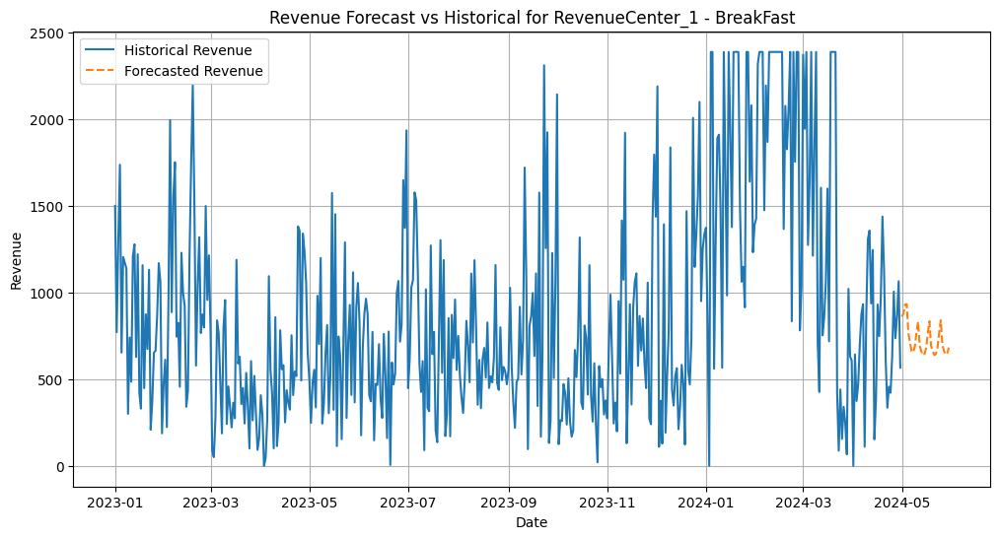

In [ ]:
import matplotlib.pyplot as plt

# Select one RevenueCenter and MealPeriod to plot (change as needed)
center = "RevenueCenter_1"
meal = "BreakFast"

# Filter historical data
historical = df[
    (df["RevenueCenterName"] == center) &
    (df["MealPeriod"] == meal)
][["Date", "Revenue"]]

# Filter forecast data
predictions = forecast[
    (forecast["RevenueCenterName"] == center) &
    (forecast["MealPeriod"] == meal)
][["Date", "Revenue_forecast"]]

plt.figure(figsize=(12,6))
plt.plot(historical["Date"], historical["Revenue"], label="Historical Revenue")
plt.plot(predictions["Date"], predictions["Revenue_forecast"], label="Forecasted Revenue", linestyle='--')
plt.title(f"Revenue Forecast vs Historical for {center} - {meal}")
plt.xlabel("Date")
plt.ylabel("Revenue")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# Save forecast results to CSV
output_path = "/content/revenue_forecast.csv"  # change path if needed
forecast.to_csv(output_path, index=False)

print(f"Forecast results saved to: {output_path}")


Forecast results saved to: /content/revenue_forecast.csv


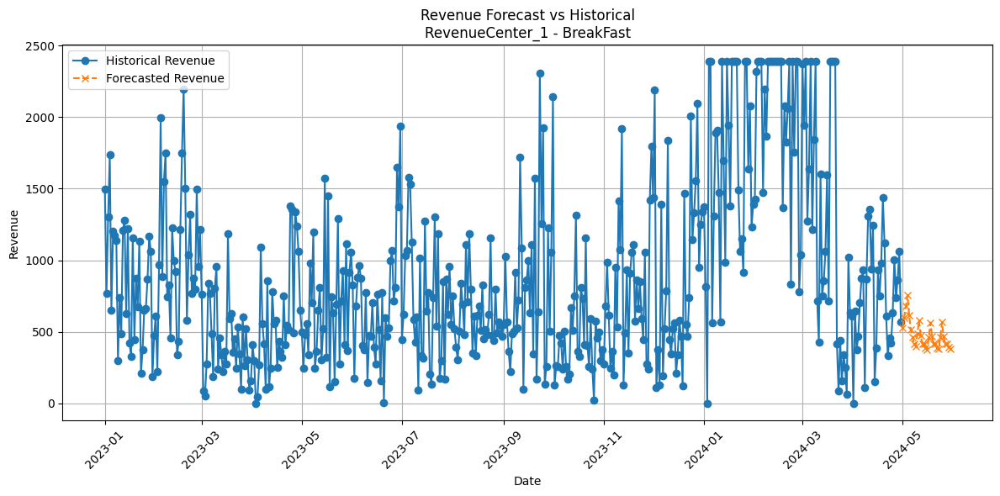

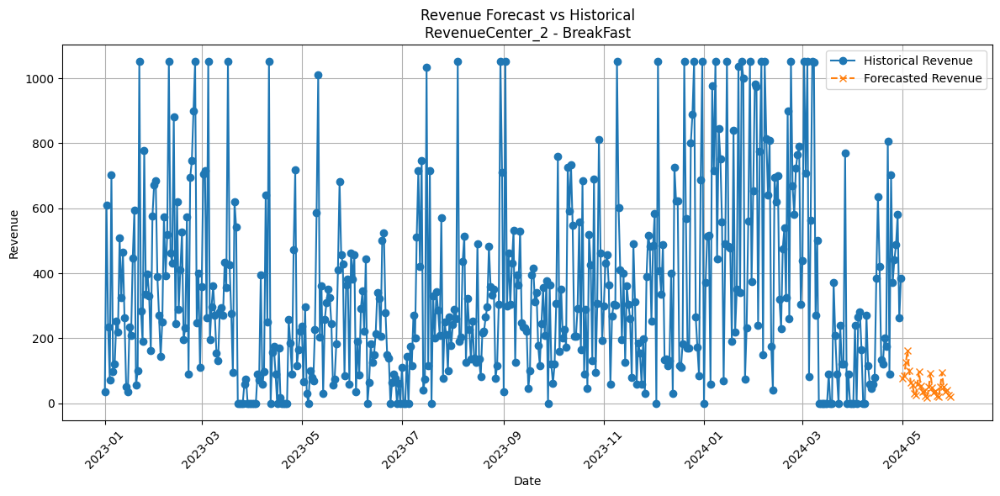

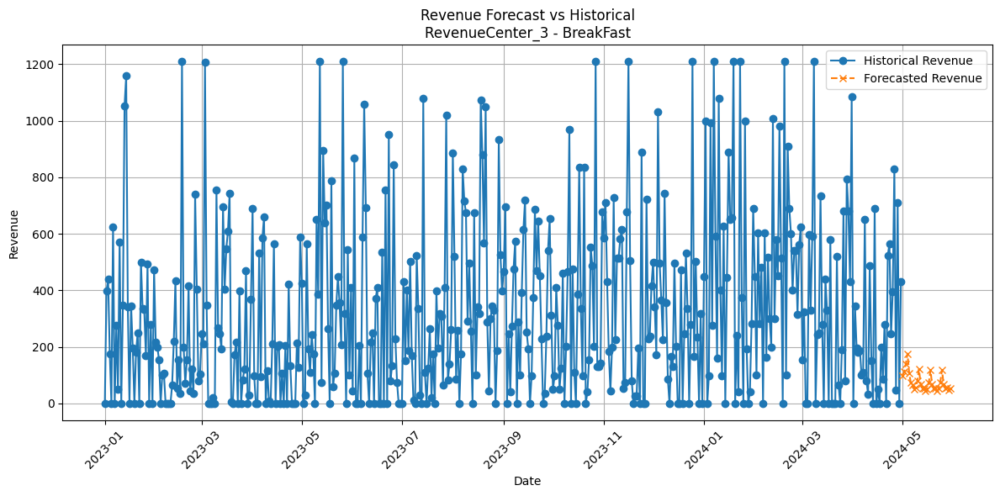

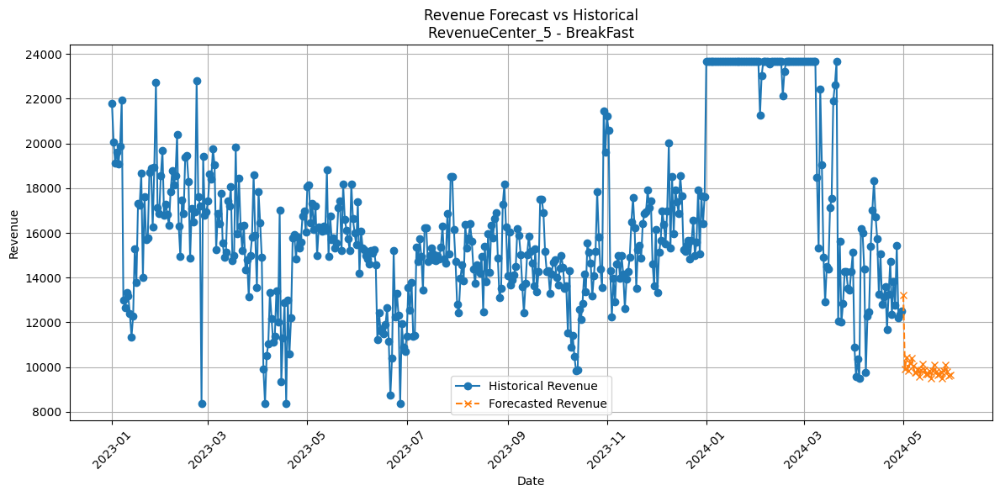

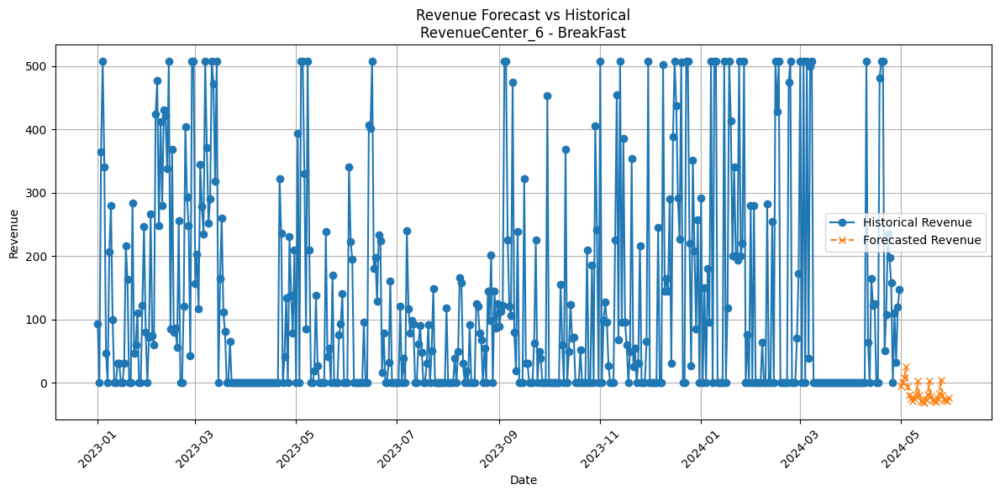

...

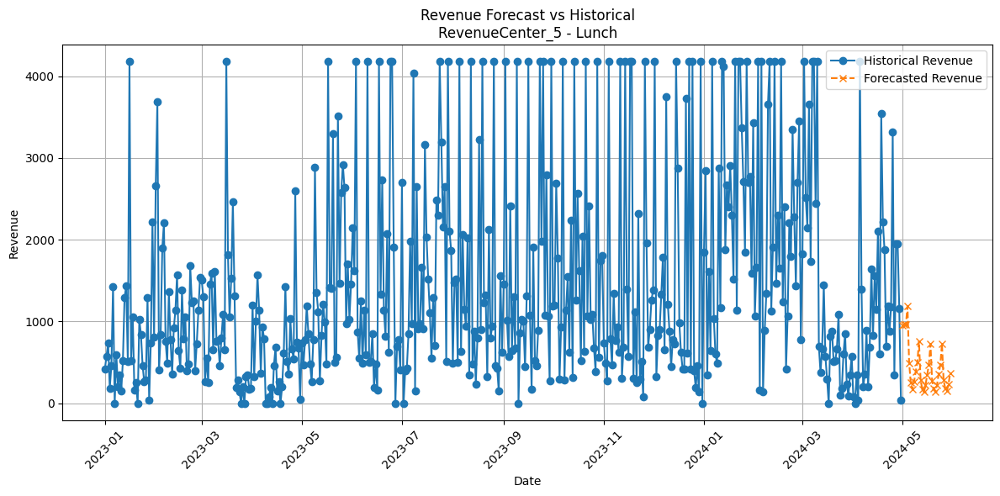

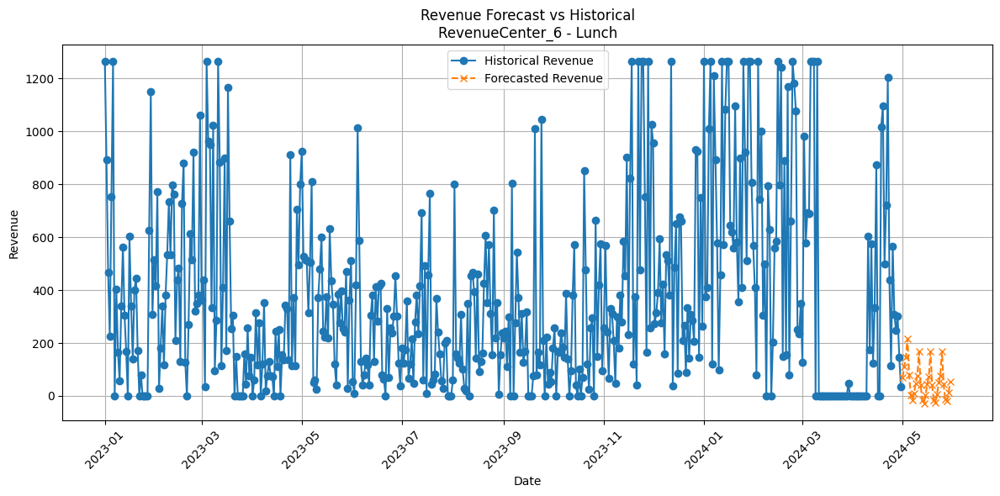

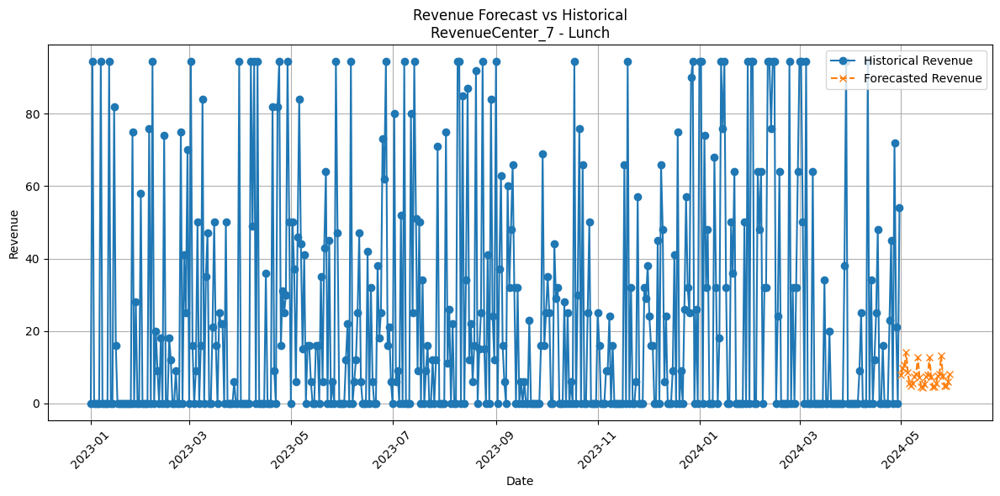

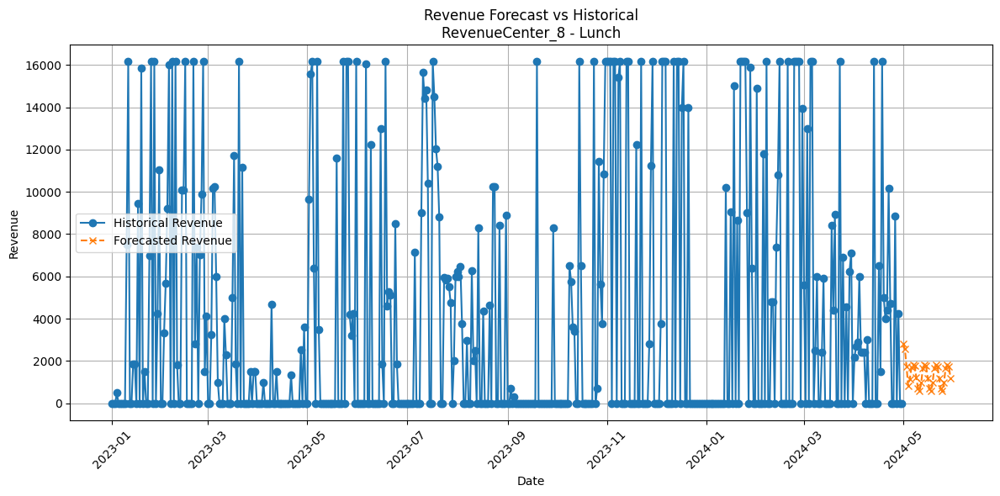

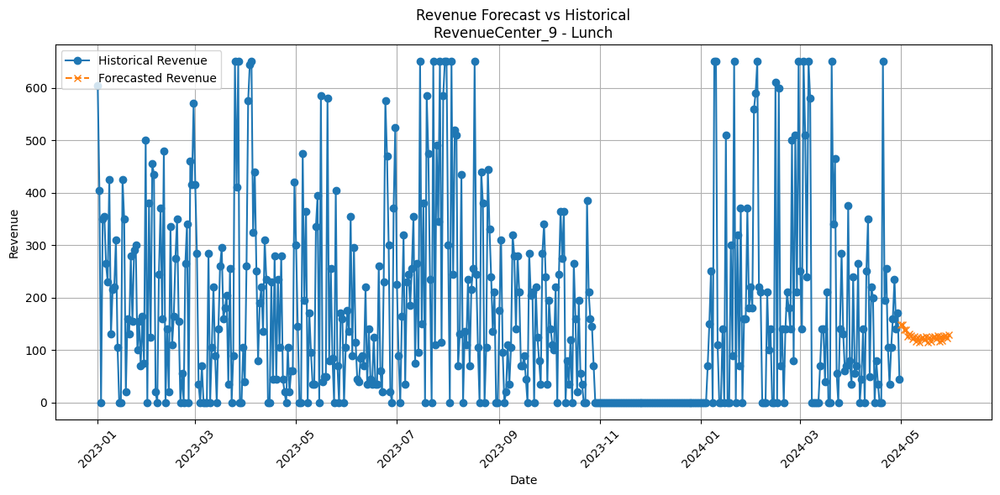

In [ ]:
import matplotlib.pyplot as plt

# Get unique combinations of RevenueCenter and MealPeriod
unique_combinations = forecast[["RevenueCenterName", "MealPeriod"]].drop_duplicates()

# Loop through each combination and plot
for _, row in unique_combinations.iterrows():
    center = row["RevenueCenterName"]
    meal = row["MealPeriod"]

    # Historical data for this combination
    historical = df[
        (df["RevenueCenterName"] == center) &
        (df["MealPeriod"] == meal)
    ][["Date", "Revenue"]]

    # Forecast data for this combination
    predictions = forecast[
        (forecast["RevenueCenterName"] == center) &
        (forecast["MealPeriod"] == meal)
    ][["Date", "Revenue_forecast"]]

    # Plot
    plt.figure(figsize=(12, 6))
    plt.plot(historical["Date"], historical["Revenue"], label="Historical Revenue", marker='o')
    plt.plot(predictions["Date"], predictions["Revenue_forecast"], label="Forecasted Revenue", linestyle="--", marker='x')
    plt.title(f"Revenue Forecast vs Historical\n{center} - {meal}")
    plt.xlabel("Date")
    plt.ylabel("Revenue")
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

# 1. Get actual and predicted values from validation set
actuals = torch.cat([y[0] for _, y in iter(val_dataloader)]).cpu().numpy()
predicted = tft.predict(val_dataloader).squeeze().cpu().numpy()

# Filter out zero actuals
nonzero_mask = actuals != 0
actuals_nonzero = actuals[nonzero_mask]
predicted_nonzero = predicted[nonzero_mask]


# Calculate metrics
rmse = np.sqrt(mean_squared_error(actuals, predicted))
mae = mean_absolute_error(actuals, predicted)
mape = np.mean(np.abs((actuals_nonzero - predicted_nonzero) / actuals_nonzero)) * 100

# 3. Print results
print("✅ Validation Forecast Evaluation Metrics:")
print(f"RMSE: {rmse:.2f}")
print(f"MAE:  {mae:.2f}")
print(f"MAPE: {mape:.2f}%")



INFO: 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


✅ Validation Forecast Evaluation Metrics:
RMSE: 3783.62
MAE:  1315.25
MAPE: 96.39%


In [ ]:
# Filter out zero actuals
nonzero_mask = actuals != 0
actuals_nonzero = actuals[nonzero_mask]
predicted_nonzero = predicted[nonzero_mask]

# Recalculate metrics
rmse = np.sqrt(mean_squared_error(actuals, predicted))
mae = mean_absolute_error(actuals, predicted)
mape = np.mean(np.abs((actuals_nonzero - predicted_nonzero) / actuals_nonzero)) * 100

# Display
print("✅ Validation Forecast Evaluation Metrics (Zero-safe):")
print(f"RMSE: {rmse:.2f}")
print(f"MAE:  {mae:.2f}")
print(f"MAPE: {mape:.2f}%")


✅ Validation Forecast Evaluation Metrics (Zero-safe):
RMSE: 4204.59
MAE:  1563.36
MAPE: 115.70%


In [ ]:

# 6. Create time index & train/val split
# ----------------------------------------
# ----------------------------------------
# Assuming 'daily' DataFrame is already prepared and sorted properly
df = df.sort_values(["mp_id", "rc_id", "Date"]).reset_index(drop=True)

# Integer time index for model
df["time_idx"] = (df["Date"] - df["Date"].min()).dt.days.astype(int)

# Define encoder and decoder lengths
max_encoder_length = 60
max_prediction_length = 30

# Training cutoff index
training_cutoff = df["time_idx"].max() - max_prediction_length

# Train on past data
train_x = df[df["time_idx"] <= training_cutoff][[
    "dow_sin", "dow_cos", "month_sin", "month_cos",
    "is_holiday", "is_weekend", "mp_id", "rc_id", "time_idx"]]
train_y = df[df["time_idx"] <= training_cutoff]["Revenue"]

# Validate on future
val_x = df[df["time_idx"] > training_cutoff][[
    "dow_sin", "dow_cos", "month_sin", "month_cos",
    "is_holiday", "is_weekend", "mp_id", "rc_id", "time_idx"
]]
val_y = df[df["time_idx"] > training_cutoff]["Revenue"]


In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Train on past data
train_x = df[df["time_idx"] <= training_cutoff][[
    "dow_sin", "dow_cos", "month_sin", "month_cos",
    "is_holiday", "is_weekend", "mp_id", "rc_id", "time_idx","Revenue_Roll7", "Revenue_Lag1"
]]
train_y = df[df["time_idx"] <= training_cutoff]["Revenue"]

# Validate on future
val_x = df[df["time_idx"] > training_cutoff][[
    "dow_sin", "dow_cos", "month_sin", "month_cos",
    "is_holiday", "is_weekend", "mp_id", "rc_id", "time_idx","Revenue_Roll7", "Revenue_Lag1"
]]
val_y = df[df["time_idx"] > training_cutoff]["Revenue"]

# Train XGBoost
model_xgb = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6)
model_xgb.fit(train_x, train_y)

# Predict and evaluate
preds_xgb = model_xgb.predict(val_x)
rmse = np.sqrt(mean_squared_error(val_y, preds_xgb))
mae = mean_absolute_error(val_y, preds_xgb)
epsilon = 1e-5  # tiny constant to avoid divide-by-zero
mape = np.mean(np.abs((val_y - preds_xgb) / (val_y + epsilon))) * 100
print("Epsilon-Corrected XGBoost MAPE:", f"{mape:.2f}%")

print("📈 XGBoost Results")
print(f"RMSE: {rmse:.2f}, MAE: {mae:.2f}, MAPE: {mape:.2f}%")


Epsilon-Corrected XGBoost MAPE: 2559327248.36%
📈 XGBoost Results
RMSE: 3489.29, MAE: 1224.55, MAPE: 2559327248.36%


In [ ]:
mask = val_y > 1e-5  # ignore zero or near-zero values
filtered_y_true = val_y[mask]
filtered_y_pred = preds_xgb[mask]

mape = np.mean(np.abs((filtered_y_true - filtered_y_pred) / filtered_y_true)) * 100
print(f"✅ Filtered MAPE (val_y > 0): {mape:.2f}%")


✅ Filtered MAPE (val_y > 0): 121.61%


In [ ]:
from lightgbm import LGBMRegressor, early_stopping
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

model_lgb = LGBMRegressor(
    objective="regression",
    learning_rate=0.05,
    n_estimators=1000,
    verbosity=-1
)

model_lgb.fit(
    train_x, train_y,
    eval_set=[(val_x, val_y)],
    callbacks=[early_stopping(stopping_rounds=10)]
)

# Predictions
preds_lgb = model_lgb.predict(val_x)

# Metrics
rmse = np.sqrt(mean_squared_error(val_y, preds_lgb))
mae = mean_absolute_error(val_y, preds_lgb)

# Avoid MAPE blow-up
mask = val_y > 1e-5
mape = np.mean(np.abs((val_y[mask] - preds_lgb[mask]) / val_y[mask])) * 100

print("📈 LightGBM Results")
print(f"RMSE: {rmse:.2f}, MAE: {mae:.2f}, MAPE (filtered): {mape:.2f}%")


Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[25]	valid_0's l2: 1.45949e+07
📈 LightGBM Results
RMSE: 3820.33, MAE: 1753.43, MAPE (filtered): 629.25%


Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[25]	valid_0's l2: 1.45949e+07
📈 LightGBM Results
RMSE: 3820.33, MAE: 1753.43, MAPE (filtered): 629.25%


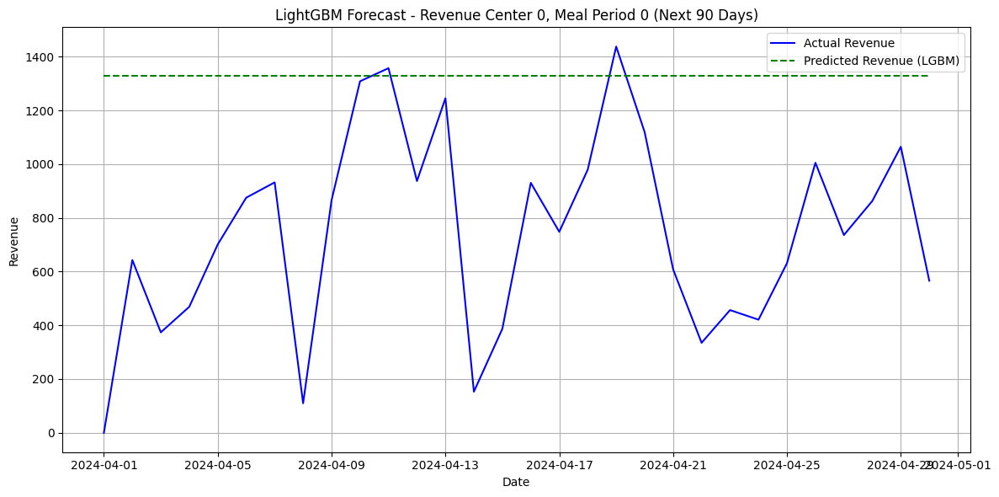

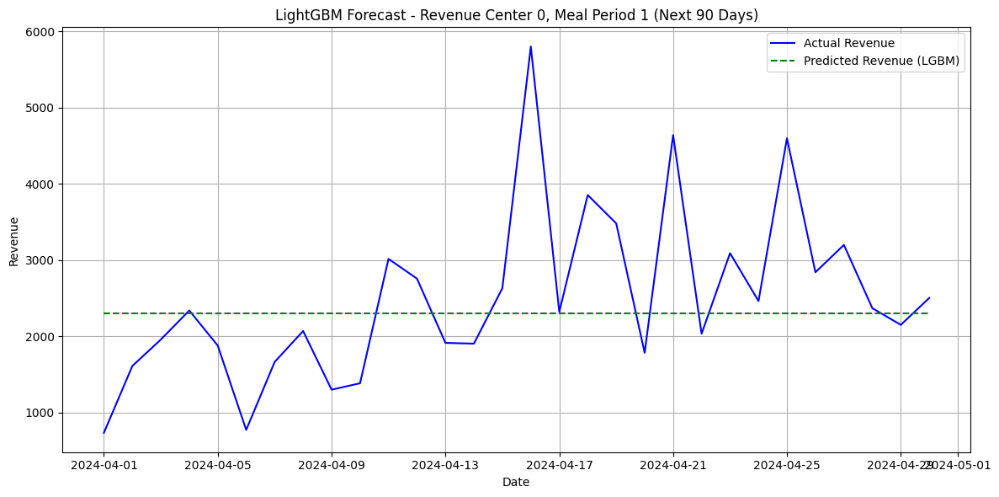

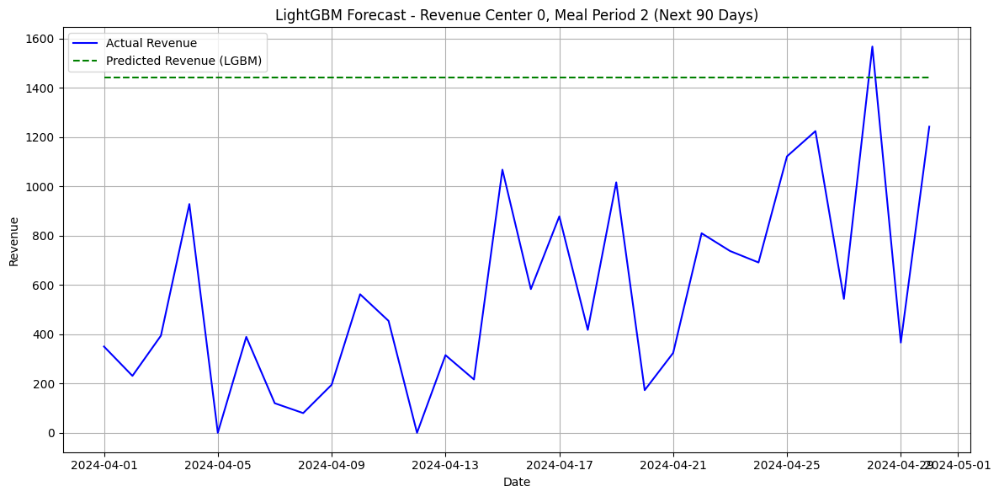

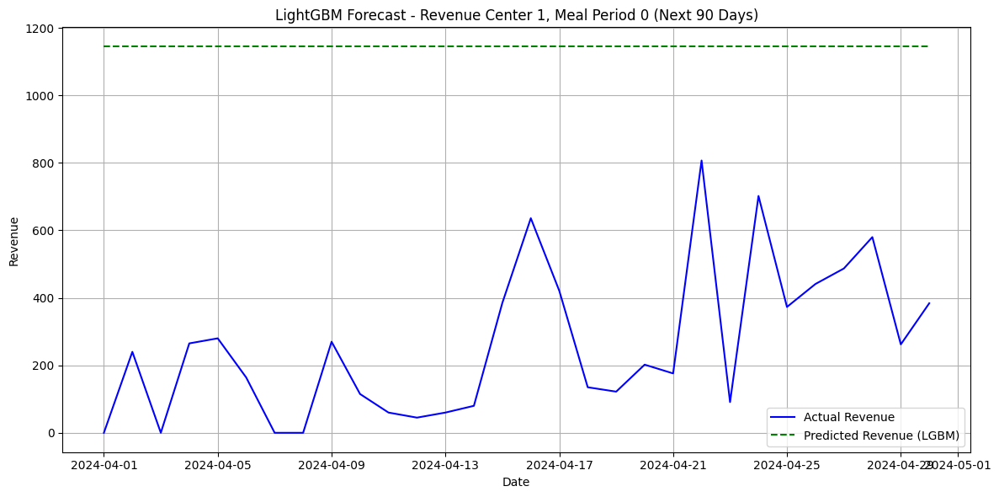

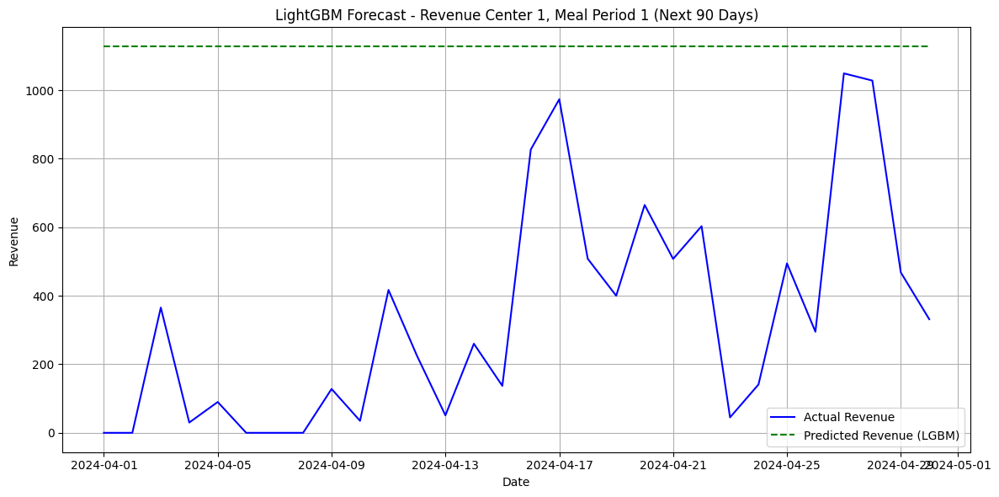

...

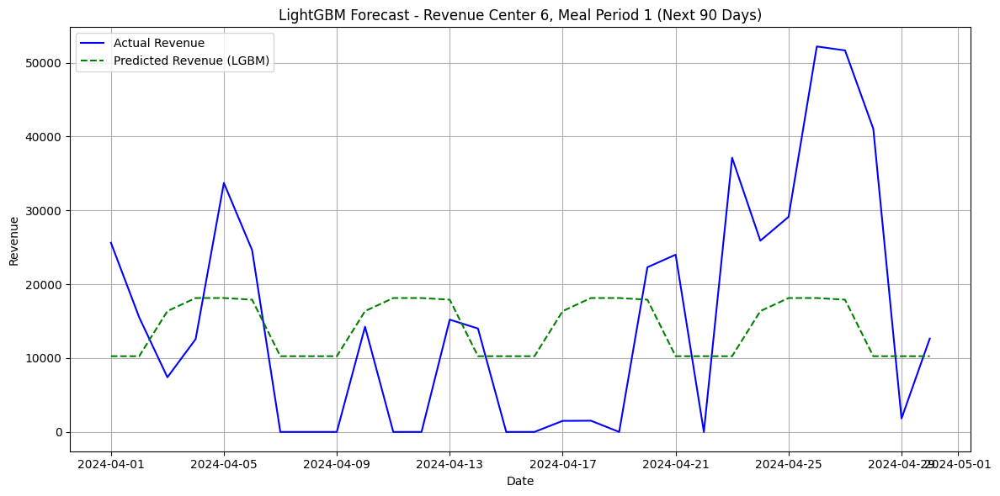

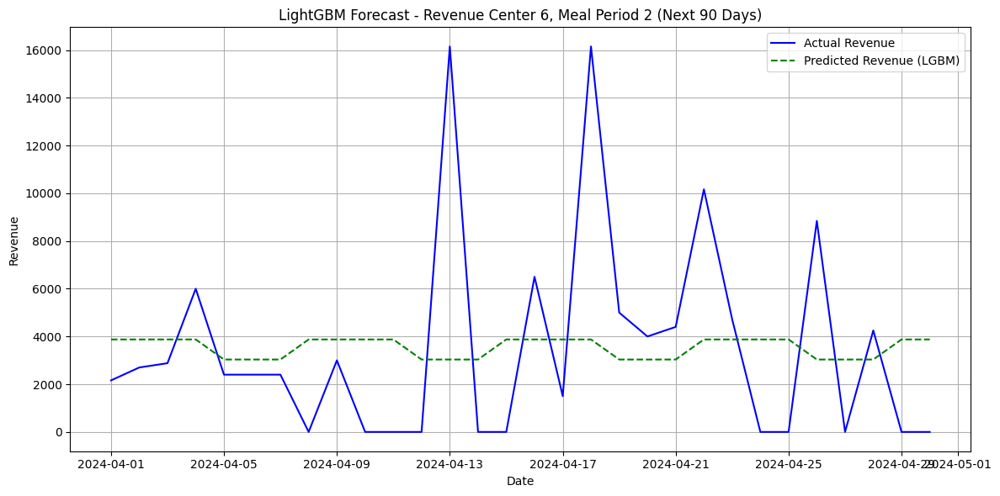

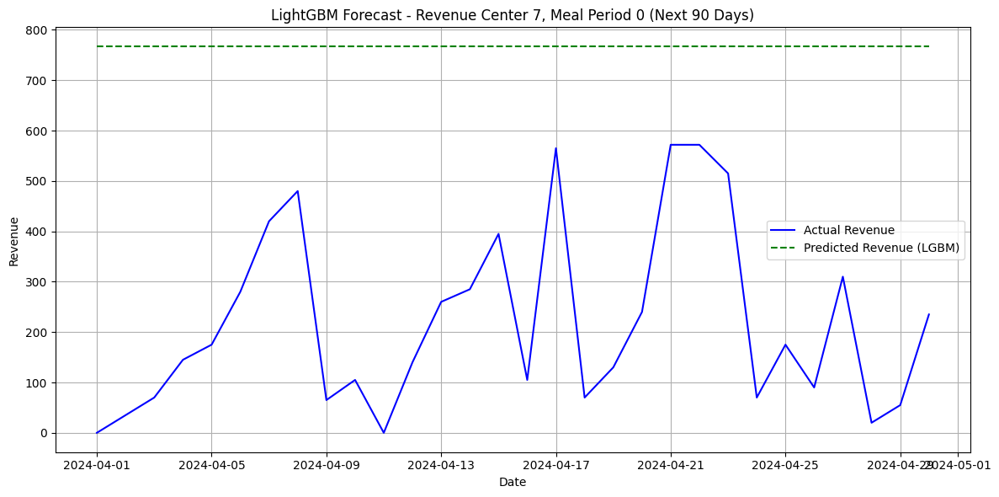

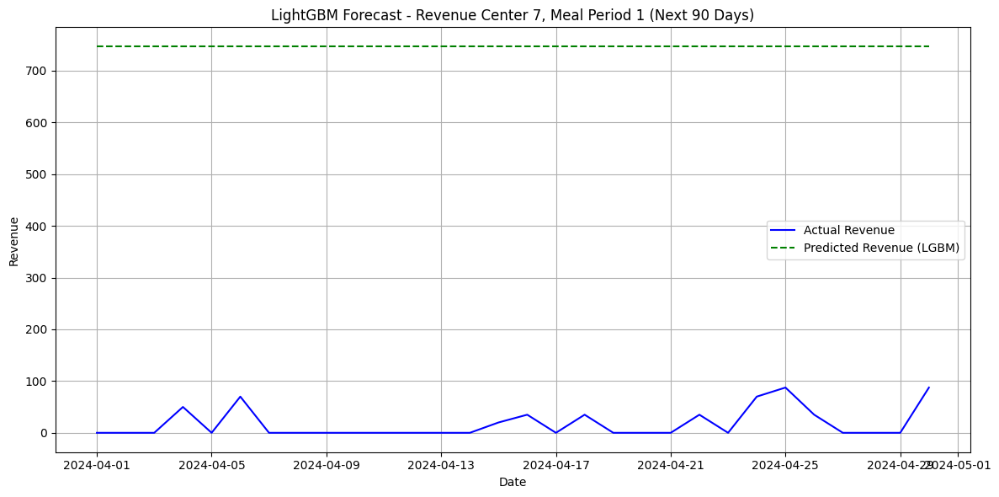

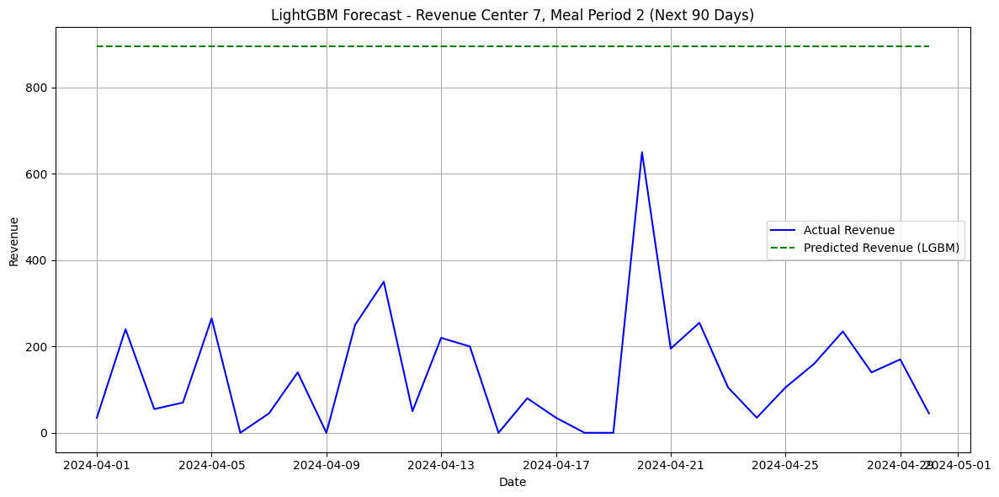

In [ ]:
from lightgbm import LGBMRegressor, early_stopping
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import matplotlib.pyplot as plt

# ===========================
# 1. Train LightGBM
# ===========================
model_lgb = LGBMRegressor(
    objective="regression",
    learning_rate=0.05,
    n_estimators=1000,
    verbosity=-1
)

model_lgb.fit(
    train_x, train_y,
    eval_set=[(val_x, val_y)],
    callbacks=[early_stopping(stopping_rounds=10)]
)

# ===========================
# 2. Predictions & Metrics
# ===========================
preds_lgb = model_lgb.predict(val_x)

rmse = np.sqrt(mean_squared_error(val_y, preds_lgb))
mae = mean_absolute_error(val_y, preds_lgb)
mask = val_y > 1e-5
mape = np.mean(np.abs((val_y[mask] - preds_lgb[mask]) / val_y[mask])) * 100

print("📈 LightGBM Results")
print(f"RMSE: {rmse:.2f}, MAE: {mae:.2f}, MAPE (filtered): {mape:.2f}%")

# ===========================
# 3. Add Predictions Back
# ===========================
df.loc[df["time_idx"] > training_cutoff, "Predicted_Revenue_LGB"] = preds_lgb

# ===========================
# 4. Filter for Next 90 Days
# ===========================
forecast_start = df[df["time_idx"] > training_cutoff]["time_idx"].min()
forecast_end = forecast_start + 90
df_90 = df[(df["time_idx"] >= forecast_start) & (df["time_idx"] < forecast_end)]

# ===========================
# 5. Plot for Each Revenue Center & Meal Period
# ===========================
unique_rc = df_90["rc_id"].unique()
unique_mp = df_90["mp_id"].unique()

for rc in unique_rc:
    for mp in unique_mp:
        subset = df_90[(df_90["rc_id"] == rc) & (df_90["mp_id"] == mp)]
        if subset.empty:
            continue

        plt.figure(figsize=(12, 6))
        plt.plot(subset["Date"], subset["Revenue"], label="Actual Revenue", color="blue")
        plt.plot(subset["Date"], subset["Predicted_Revenue_LGB"], label="Predicted Revenue (LGBM)", color="green", linestyle="--")
        plt.title(f"LightGBM Forecast - Revenue Center {rc}, Meal Period {mp} (Next 90 Days)")
        plt.xlabel("Date")
        plt.ylabel("Revenue")
        plt.legend()
        plt.grid()
        plt.tight_layout()
        plt.show()


In [ ]:
# ===========================
# 6. Save Forecasting Results
# ===========================

# Select relevant columns for saving
forecast_lgb = df_90[["Date", "mp_id", "rc_id", "Revenue", "Predicted_Revenue_LGB"]].copy()
forecast_lgb = forecast_lgb.rename(columns={
    "Revenue": "Actual_Revenue",
    "Predicted_Revenue_LGB": "Forecasted_Revenue"
})

# Save to CSV
output_path = "/content/lightgbm_forecast_90days.csv"  # Change path if needed
forecast_lgb.to_csv(output_path, index=False)

print(f"✅ Forecasting results saved to: {output_path}")


✅ Forecasting results saved to: /content/lightgbm_forecast_90days.csv


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import (Input, Conv1D, MaxPooling1D,
                                     LSTM, Dense, Dropout)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [ ]:

# Fill NaNs in lag and rolling features after creation
df["Revenue_Lag1"] = df["Revenue_Lag1"].fillna(0)  # or .fillna(0)
df["Revenue_Roll7"] = df["Revenue_Roll7"].fillna(0)  # or .fillna(df["Revenue"])



In [ ]:


import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization, Bidirectional, Conv2D, MaxPooling2D, Flatten
from keras.layers import Activation

# === Assuming you already have train_x, train_y, val_x, val_y as Pandas DataFrames/Series ===

# 1. Reshape input features for CNN-LSTM
total_features = train_x.shape[1]

# For your data, timesteps=1 works (features_per_timestep = total_features)
timesteps = 1
num_features = total_features // timesteps

X_train = train_x.values.reshape(-1, timesteps, num_features)
X_val = val_x.values.reshape(-1, timesteps, num_features)

y_train = train_y.values
y_val = val_y.values

print(f"Reshaped inputs: X_train {X_train.shape}, X_val {X_val.shape}")

# 2. Build CNN-LSTM model
from tensorflow.keras import models, layers

from tensorflow.keras import models, layers, Input

model = models.Sequential([
    Input(shape=(timesteps, num_features)),

    layers.Conv1D(64, kernel_size=1, activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling1D(pool_size=1),
    layers.Dropout(0.3),

    layers.Conv1D(128, kernel_size=1, activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling1D(pool_size=1),
    layers.Dropout(0.3),

    layers.Bidirectional(layers.LSTM(64, return_sequences=False)),
    layers.Dropout(0.3),

    layers.Dense(64, activation='relu'),
    layers.Dense(32, activation='relu'),
    layers.Dense(1)
])

model.compile(optimizer='adam', loss='mse', metrics=['mae'])
model.summary()



# Before training
from sklearn.preprocessing import MinMaxScaler

scaler_y = MinMaxScaler()
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1))
y_val_scaled = scaler_y.transform(y_val.reshape(-1, 1))

# Model training with scaled targets
history = model.fit(
    X_train, y_train_scaled,
    validation_data=(X_val, y_val_scaled),
    epochs=30,
    batch_size=32,
    verbose=1
)

# After prediction
y_pred_scaled = model.predict(X_val)
y_pred = scaler_y.inverse_transform(y_pred_scaled).flatten()

# 5. Evaluation metrics
rmse = np.sqrt(mean_squared_error(y_val, y_pred))
mae = mean_absolute_error(y_val, y_pred)
mape = np.mean(np.abs((y_val - y_pred) / np.where(y_val == 0, 1e-5, y_val))) * 100

print("\n📈 CNN-LSTM Results")
print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")
print(f"MAPE: {mape:.2f}%")


Reshaped inputs: X_train (10944, 1, 9), X_val (720, 1, 9)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 1, 64)          │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1, 64)          │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 1, 128)         │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1, 128)         │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 1, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 128)            │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 118,913 (464.50 KB)

 Trainable params: 118,529 (463.00 KB)

 Non-trainable params: 384 (1.50 KB)

Epoch 1/30
342/342 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0161 - mae: 0.0814 - val_loss: 0.0114 - val_mae: 0.0738
Epoch 2/30
342/342 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0131 - mae: 0.0679 - val_loss: 0.0110 - val_mae: 0.0584
Epoch 3/30
342/342 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0127 - mae: 0.0656 - val_loss: 0.0114 - val_mae: 0.0734
Epoch 4/30
342/342 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0112 - mae: 0.0625 - val_loss: 0.0123 - val_mae: 0.0842
Epoch 5/30
342/342 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0121 - mae: 0.0663 - val_loss: 0.0115 - val_mae: 0.0747
Epoch 6/30
342/342 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0125 - mae: 0.0651 - val_loss: 0.0115 - val_mae: 0.0745
Epoch 7/30
342/342 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0121 - mae: 0.0649 - val_loss: 0.0114 - val_mae: 0.0733
Epoch 8/30
342/342 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0116 - mae: 0.0641 - val_loss: 0.0113 - val_mae: 0.0709
Epoch 9/30
342/342 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step

In [ ]:
import numpy as np

def safe_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0  # Avoid division by zero
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100
mape = safe_mape(y_val, y_pred)
print(f"MAPE: {mape:.2f}%")


MAPE: 295.53%
